In [1]:

SeuratData::InstallData("pbmc3k")

Warning message:
“The following packages are already installed and will not be reinstalled: pbmc3k”


In [2]:
library(Seurat)
library(SeuratData)
library(ggplot2)
library(patchwork)
pbmc3k.final <- LoadData("pbmc3k", type = "pbmc3k.final")
pbmc3k.final$groups <- sample(c("group1", "group2"), size = ncol(pbmc3k.final), replace = TRUE)
features <- c("LYZ", "CCL5", "IL32", "PTPRCAP", "FCGR3A", "PF4")
pbmc3k.final

Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built under R 4.4.0 but the current version is
4.4.2; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed

‘SeuratObject’ was built with package ‘Matrix’ 1.7.0 but the current
version is 1.7.1; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


── Installed datasets ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── SeuratData v0.2.2.9001 ──

✔ pbmc3k 3.1.4                                                                          


────────────────────────────────────────────────────────────────────────────────────── Key ──────────────────────────────────────────────────────────────────────────────────────

✔ Dataset loaded successfully
❯

An object of class Seurat 
13714 features across 2638 samples within 1 assay 
Active assay: RNA (13714 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 2 dimensional reductions calculated: pca, umap

Picking joint bandwidth of 0.318

Picking joint bandwidth of 0.177

Picking joint bandwidth of 0.161

Picking joint bandwidth of 0.15

Picking joint bandwidth of 0.0894

Picking joint bandwidth of 0.0298



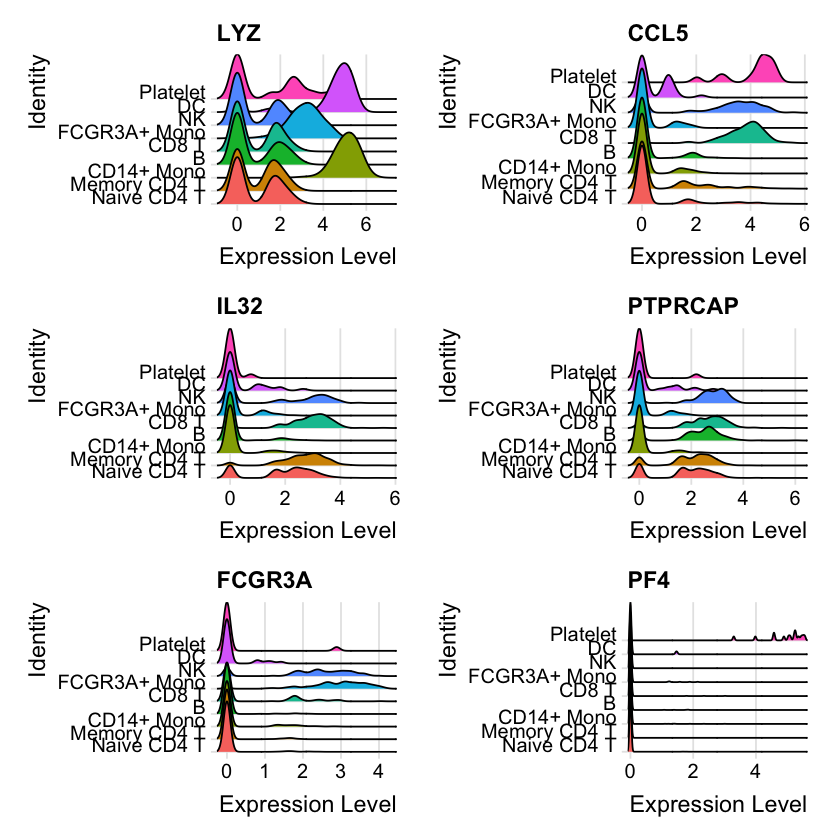

In [3]:
# Ridge plots - from ggridges. Visualize single cell expression distributions in each cluster
RidgePlot(pbmc3k.final, features = features, ncol = 2)

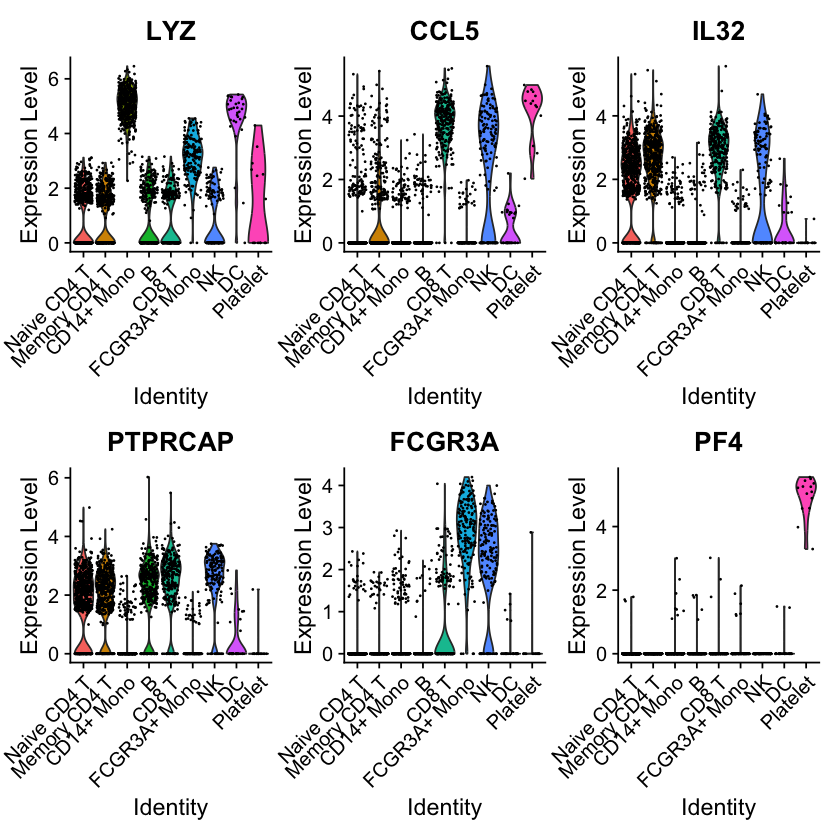

In [4]:
# Violin plot - Visualize single cell expression distributions in each cluster
VlnPlot(pbmc3k.final, features = features)

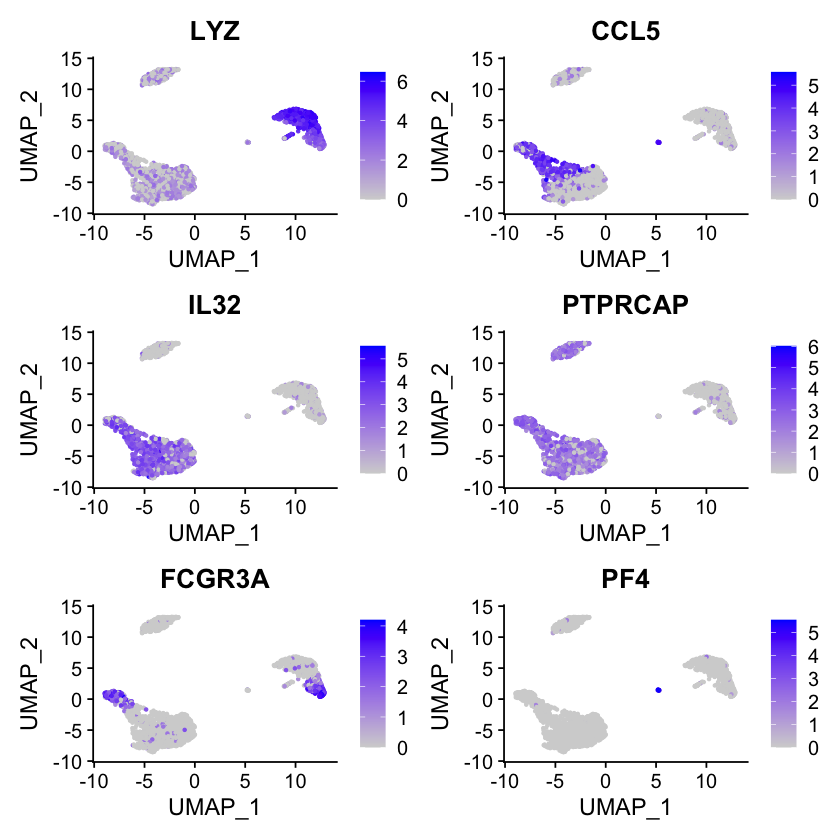

In [5]:
# Feature plot - visualize feature expression in low-dimensional space
FeaturePlot(pbmc3k.final, features = features)

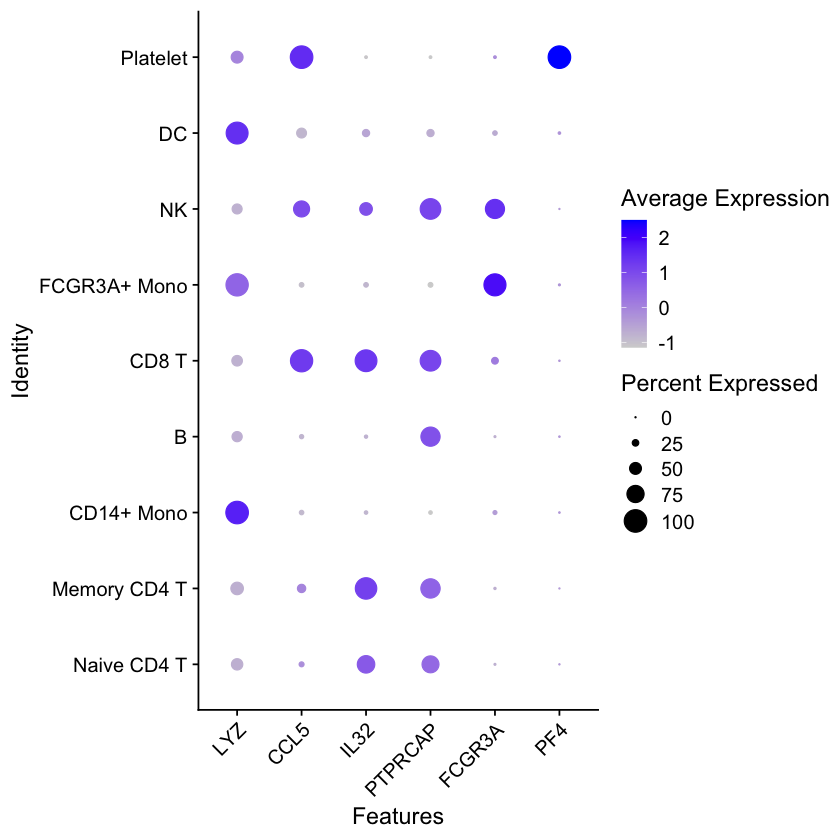

In [6]:
# Dot plots - the size of the dot corresponds to the percentage of cells expressing the
# feature in each cluster. The color represents the average expression level
DotPlot(pbmc3k.final, features = features) + RotatedAxis()

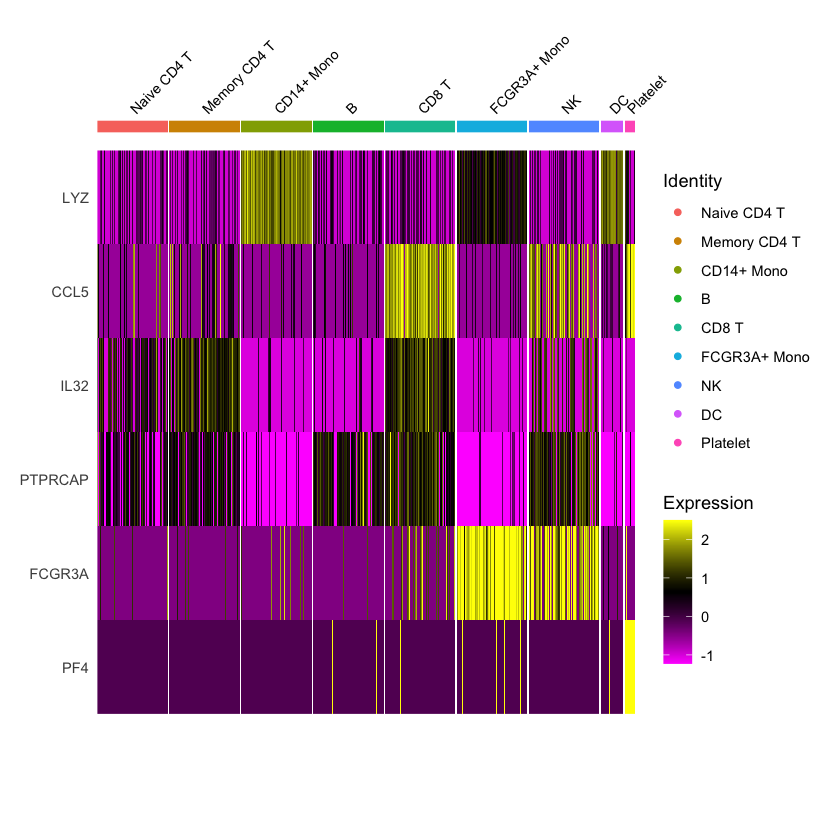

In [7]:
# Single cell heatmap of feature expression
DoHeatmap(subset(pbmc3k.final, downsample = 100), features = features, size = 3)

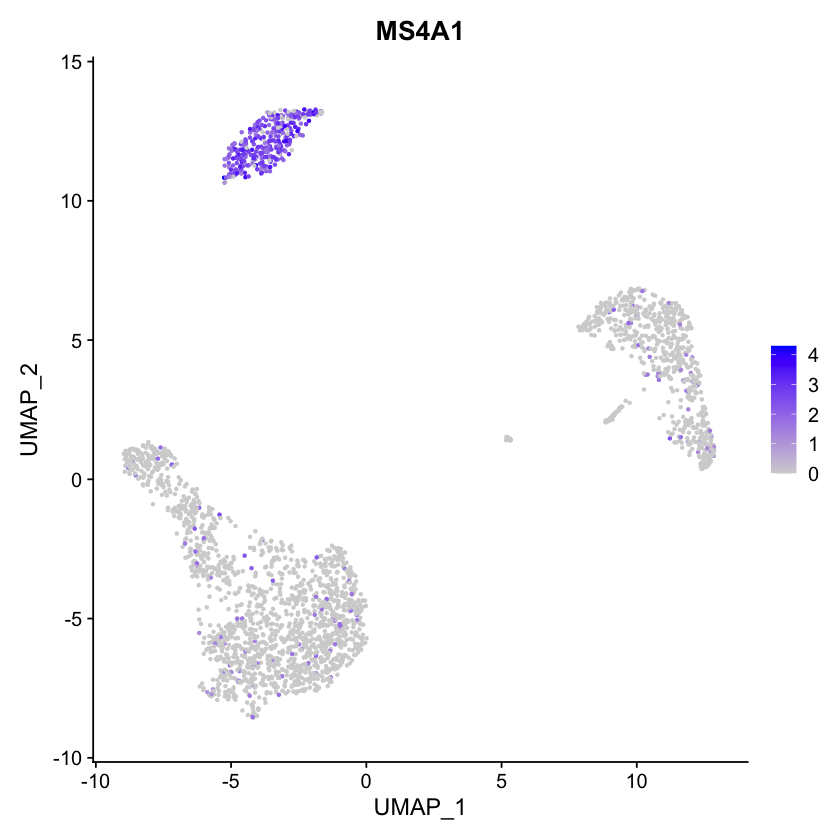

In [8]:
# Plot a legend to map colors to expression levels
FeaturePlot(pbmc3k.final, features = "MS4A1")

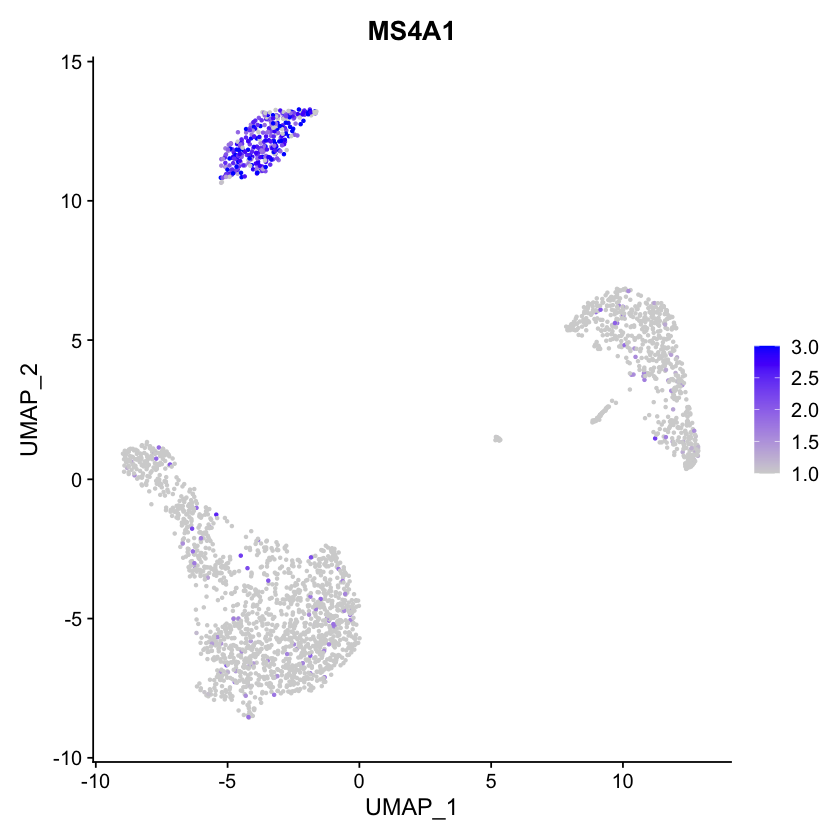

In [9]:
# Adjust the contrast in the plot
FeaturePlot(pbmc3k.final, features = "MS4A1", min.cutoff = 1, max.cutoff = 3)

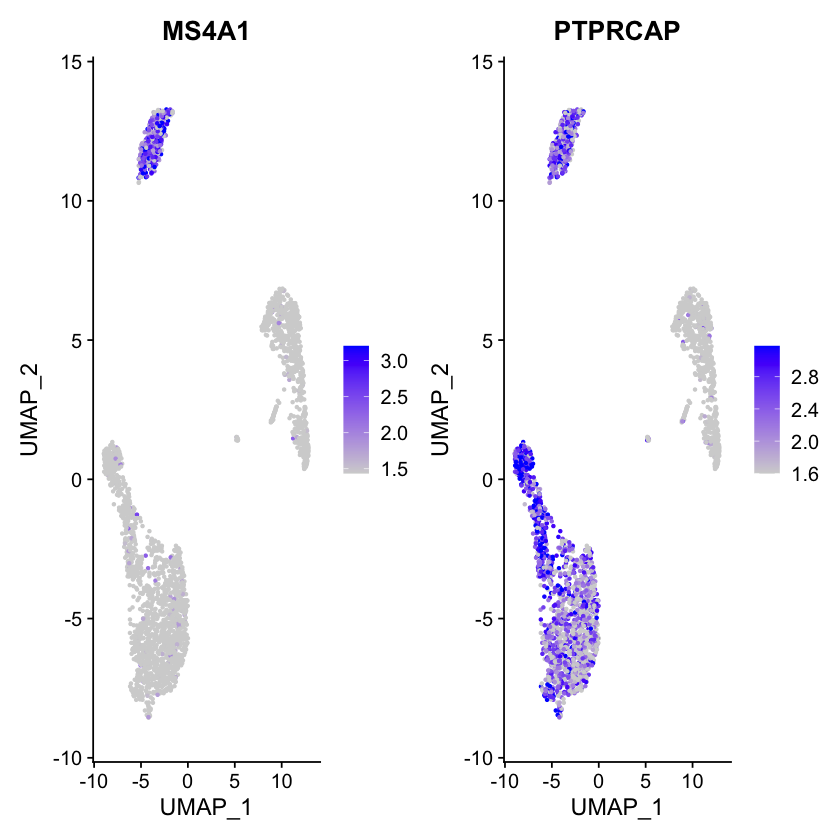

In [10]:
# Calculate feature-specific contrast levels based on quantiles of non-zero expression.
# Particularly useful when plotting multiple markers
FeaturePlot(pbmc3k.final, features = c("MS4A1", "PTPRCAP"), min.cutoff = "q10", max.cutoff = "q90")

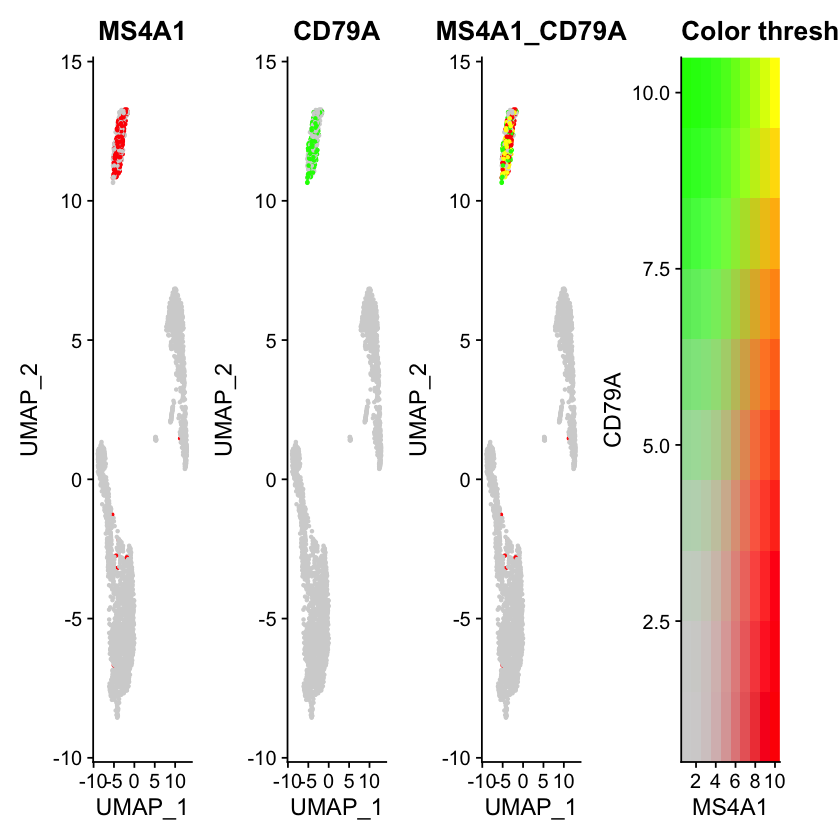

In [11]:
# Visualize co-expression of two features simultaneously
FeaturePlot(pbmc3k.final, features = c("MS4A1", "CD79A"), blend = TRUE)

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



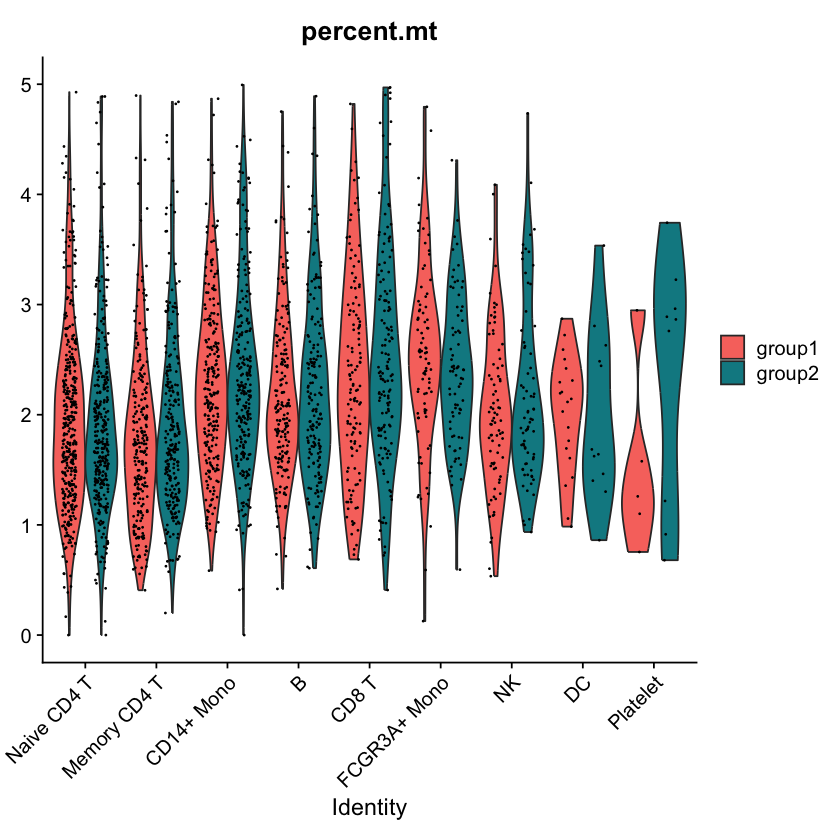

In [12]:
# Violin plots can also be split on some variable. Simply add the splitting variable to object
# metadata and pass it to the split.by argument
VlnPlot(pbmc3k.final, features = "percent.mt", split.by = "groups")

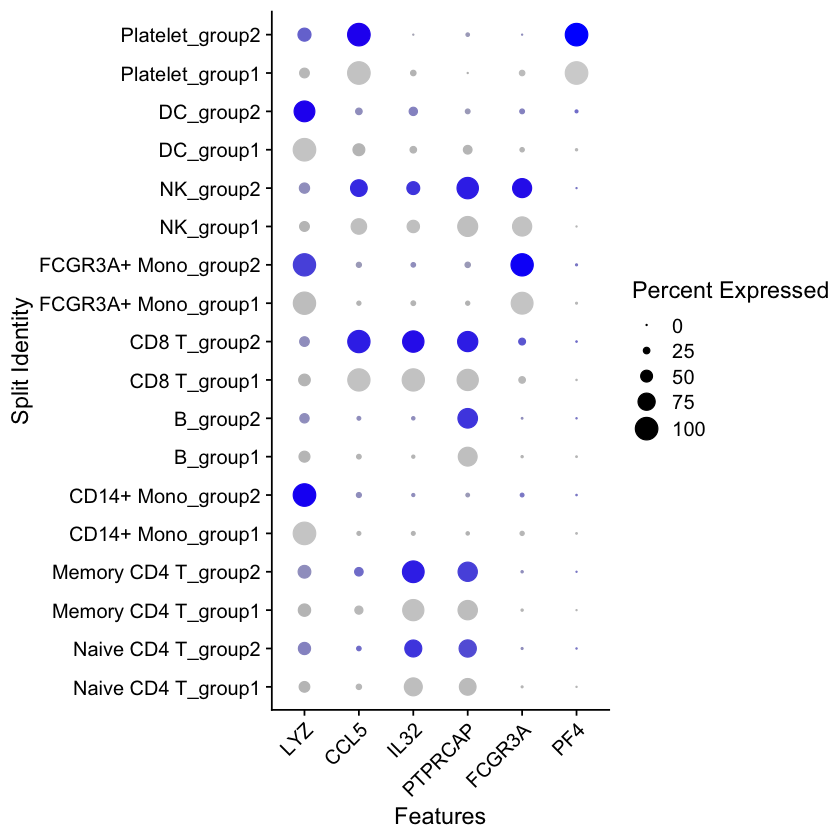

In [13]:
# SplitDotPlotGG has been replaced with the `split.by` parameter for DotPlot
DotPlot(pbmc3k.final, features = features, split.by = "groups") + RotatedAxis()

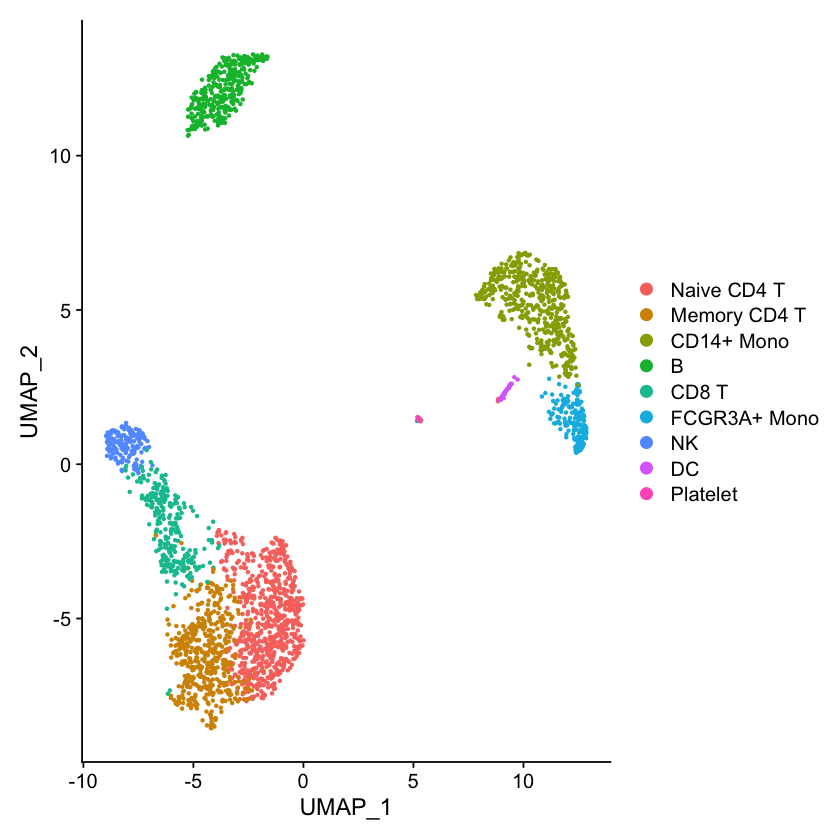

In [14]:
# DimPlot replaces TSNEPlot, PCAPlot, etc. In addition, it will plot either 'umap', 'tsne', or
# 'pca' by default, in that order
DimPlot(pbmc3k.final)

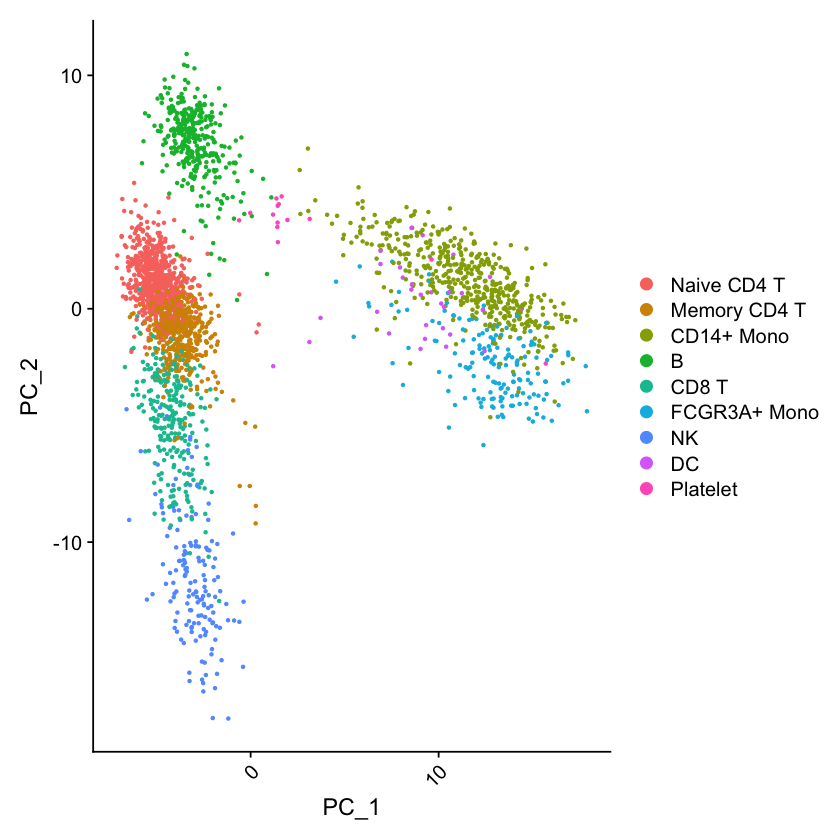

In [15]:
pbmc3k.final.no.umap <- pbmc3k.final
pbmc3k.final.no.umap[["umap"]] <- NULL
DimPlot(pbmc3k.final.no.umap) + RotatedAxis()

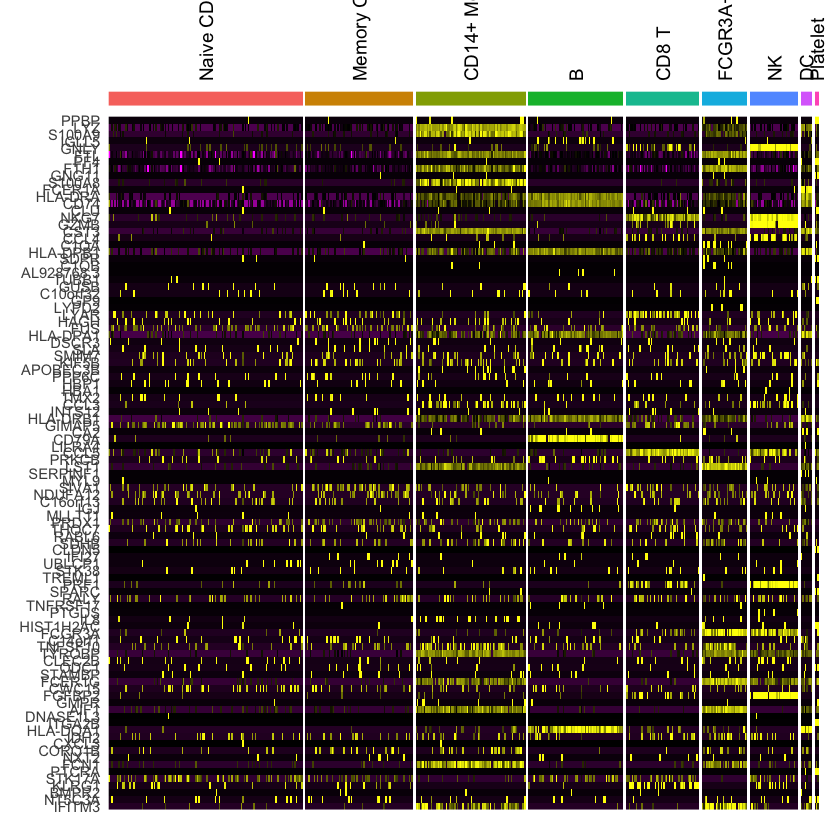

In [16]:
# DoHeatmap now shows a grouping bar, splitting the heatmap into groups or clusters. This can
# be changed with the `group.by` parameter
DoHeatmap(pbmc3k.final, features = VariableFeatures(pbmc3k.final)[1:100], cells = 1:500, size = 4,
    angle = 90) + NoLegend()

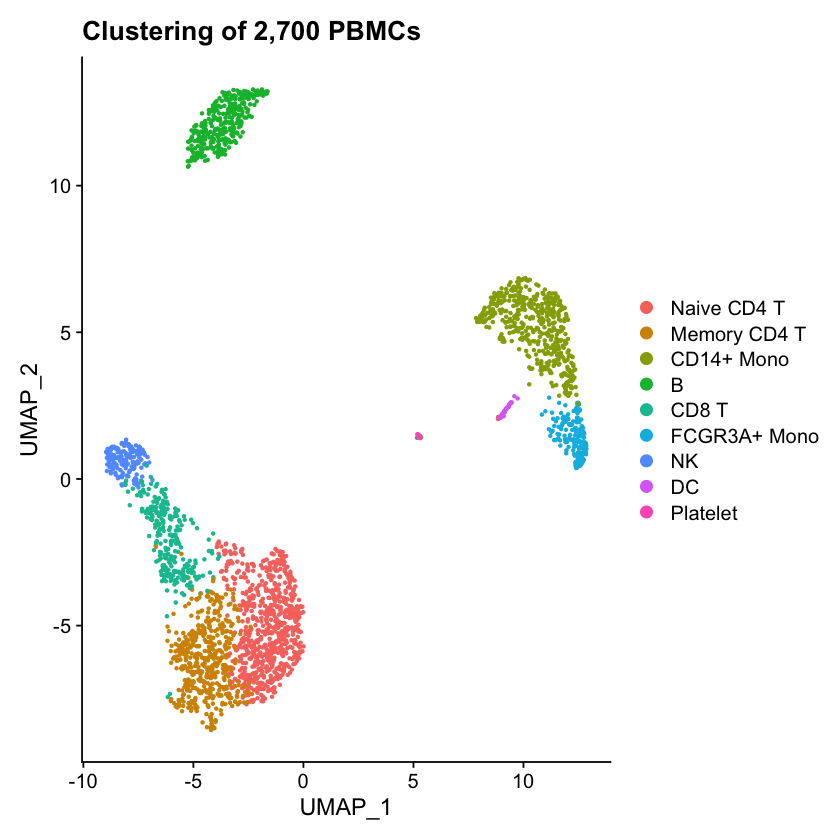

In [17]:
baseplot <- DimPlot(pbmc3k.final, reduction = "umap")
# Add custom labels and titles
baseplot + labs(title = "Clustering of 2,700 PBMCs")

In [20]:
# Use community-created themes, overwriting the default Seurat-applied theme Install ggmin
# with remotes::install_github('sjessa/ggmin')
baseplot + ggmin::theme_powerpoint()

ERROR: Error in loadNamespace(x): there is no package called ‘ggmin’


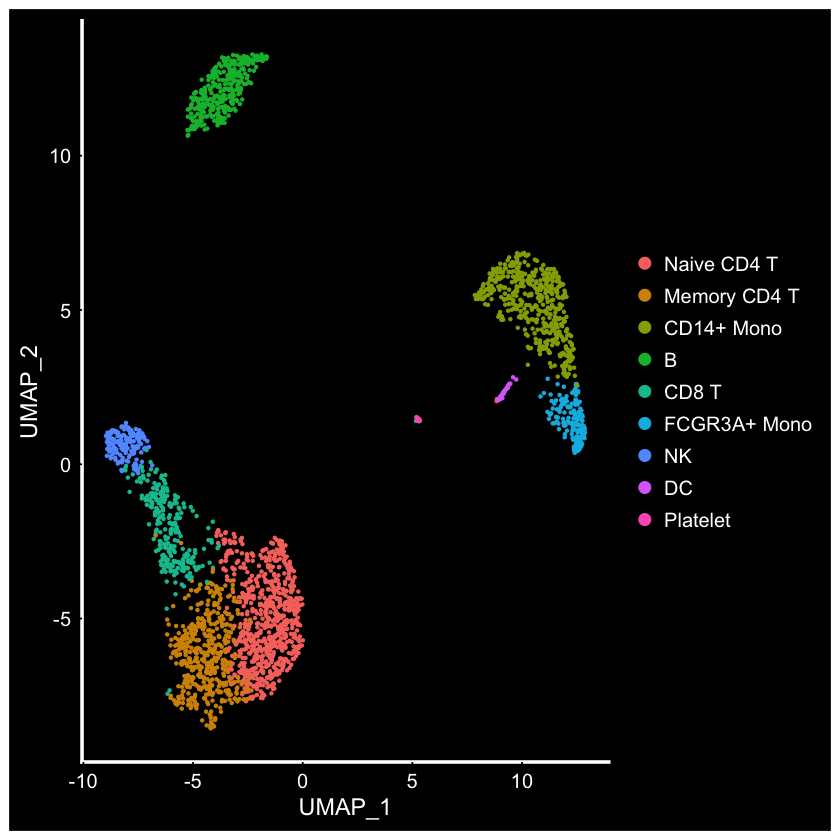

In [22]:
# Seurat also provides several built-in themes, such as DarkTheme; for more details see
# ?SeuratTheme
baseplot + DarkTheme()

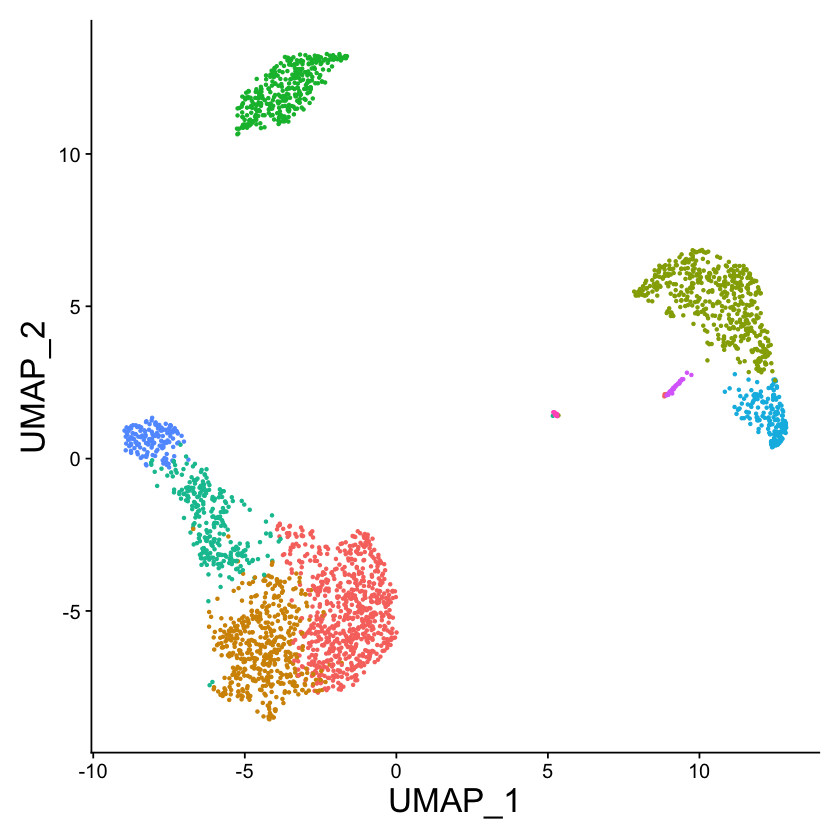

In [24]:
# Chain themes together
baseplot + FontSize(x.title = 20, y.title = 20) + NoLegend()

Warning message:
“`error_y.color` does not currently support multiple values.”
Warning message:
“`error_x.color` does not currently support multiple values.”
Warning message:
“`line.color` does not currently support multiple values.”
Warning message:
“The titlefont attribute is deprecated. Use title = list(font = ...) instead.”
Warning message:
“`error_y.color` does not currently support multiple values.”
Warning message:
“`error_x.color` does not currently support multiple values.”
Warning message:
“`line.color` does not currently support multiple values.”
Warning message:
“The titlefont attribute is deprecated. Use title = list(font = ...) instead.”


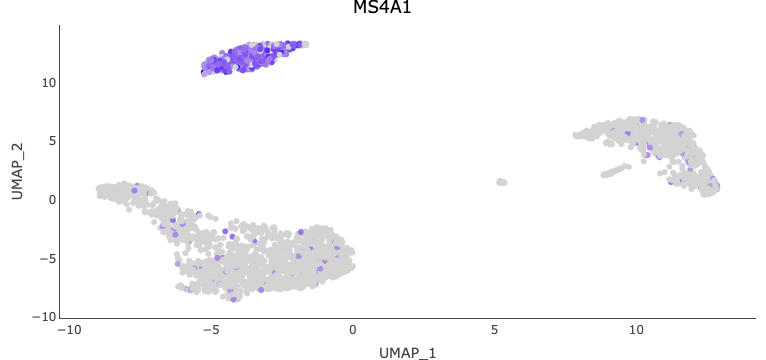

In [26]:
# Include additional data to display alongside cell names by passing in a data frame of
# information.  Works well when using FetchData
plot <- FeaturePlot(pbmc3k.final, features = "MS4A1")
HoverLocator(plot = plot, information = FetchData(pbmc3k.final, vars = c("ident", "PC_1", "nFeature_RNA")))

In [28]:
head(select.cells)

ERROR: Error: object 'select.cells' not found


In [30]:
Idents(pbmc3k.final, cells = select.cells) <- "NewCells"

# Now, we find markers that are specific to the new cells, and find clear DC markers
newcells.markers <- FindMarkers(pbmc3k.final, ident.1 = "NewCells", ident.2 = "CD14+ Mono", min.diff.pct = 0.3,
    only.pos = TRUE)
head(newcells.markers)

ERROR: Error: object 'select.cells' not found


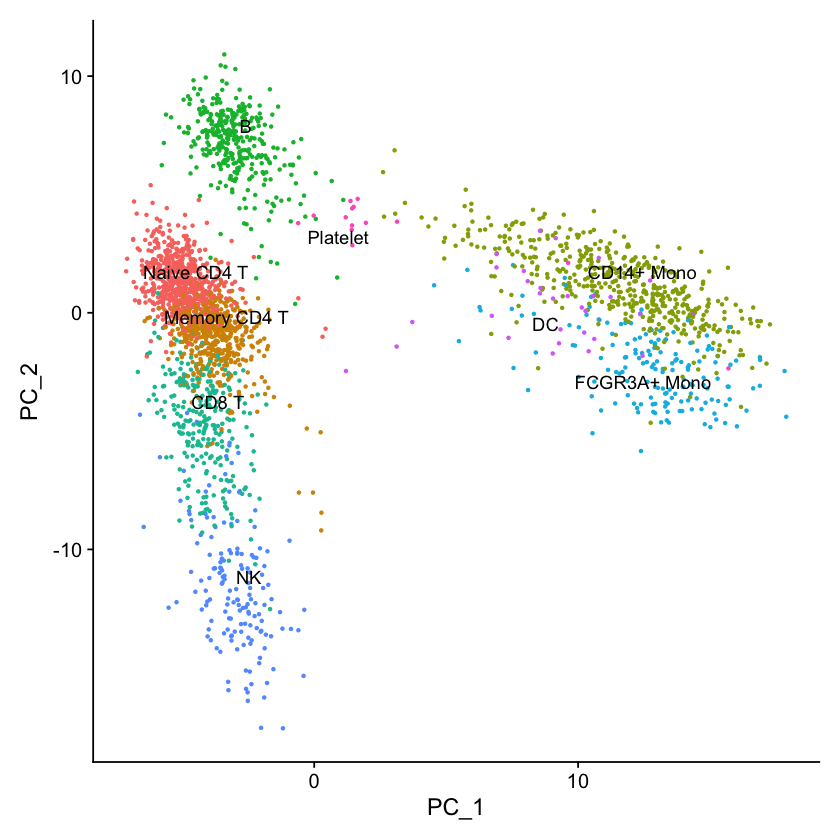

In [32]:
# LabelClusters and LabelPoints will label clusters (a coloring variable) or individual points
# on a ggplot2-based scatter plot
plot <- DimPlot(pbmc3k.final, reduction = "pca") + NoLegend()
LabelClusters(plot = plot, id = "ident")

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“ggrepel: 13 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


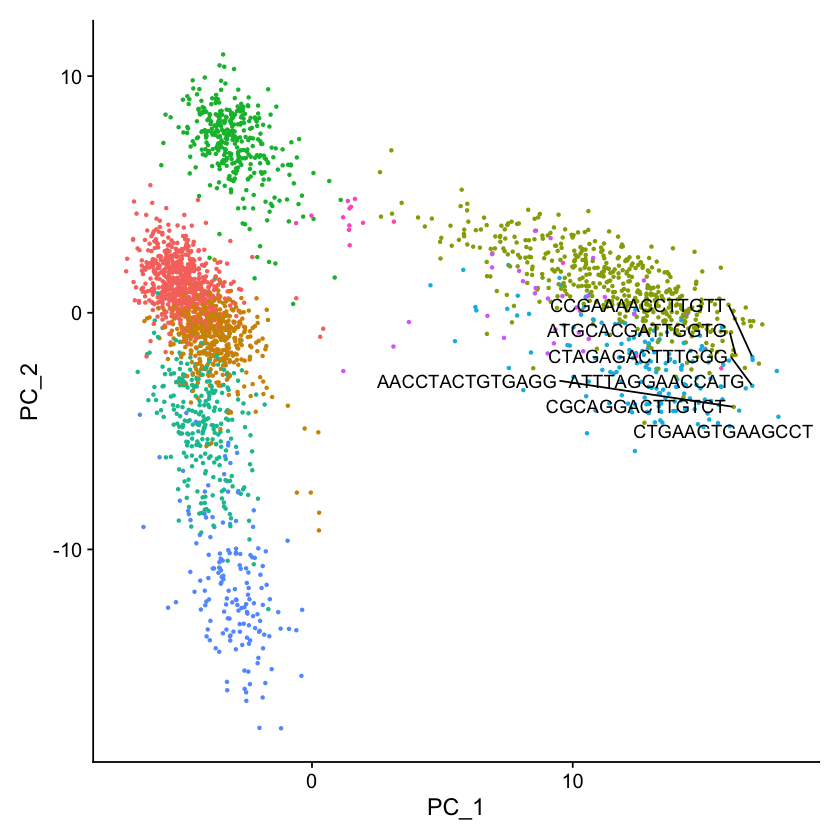

In [34]:
# Both functions support `repel`, which will intelligently stagger labels and draw connecting
# lines from the labels to the points or clusters
LabelPoints(plot = plot, points = TopCells(object = pbmc3k.final[["pca"]]), repel = TRUE)

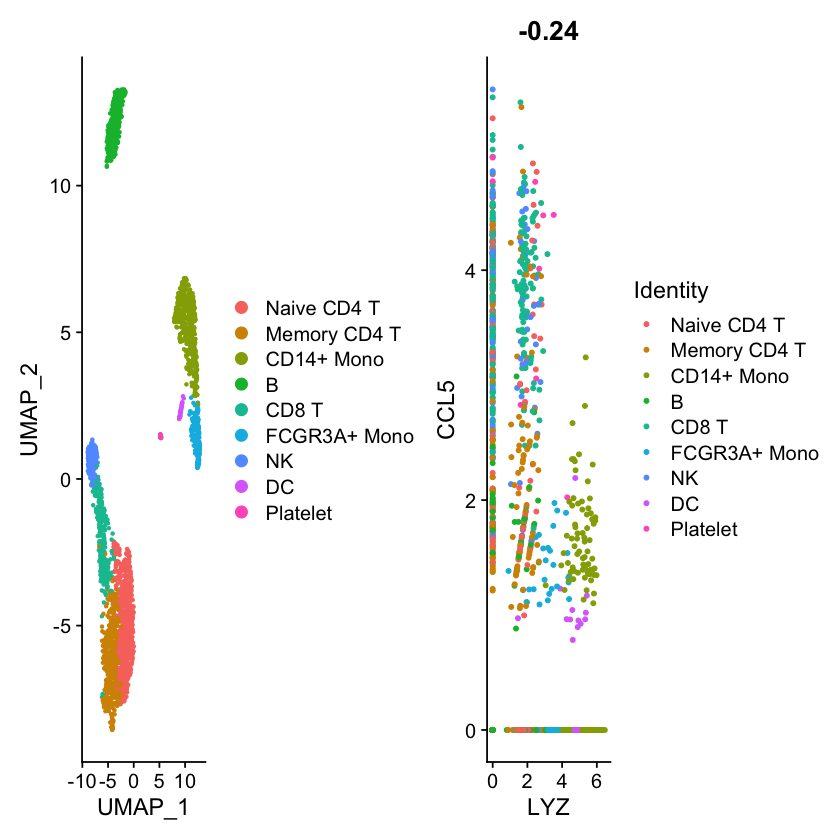

In [36]:
plot1 <- DimPlot(pbmc3k.final)
# Create scatter plot with the Pearson correlation value as the title
plot2 <- FeatureScatter(pbmc3k.final, feature1 = "LYZ", feature2 = "CCL5")
# Combine two plots
plot1 + plot2

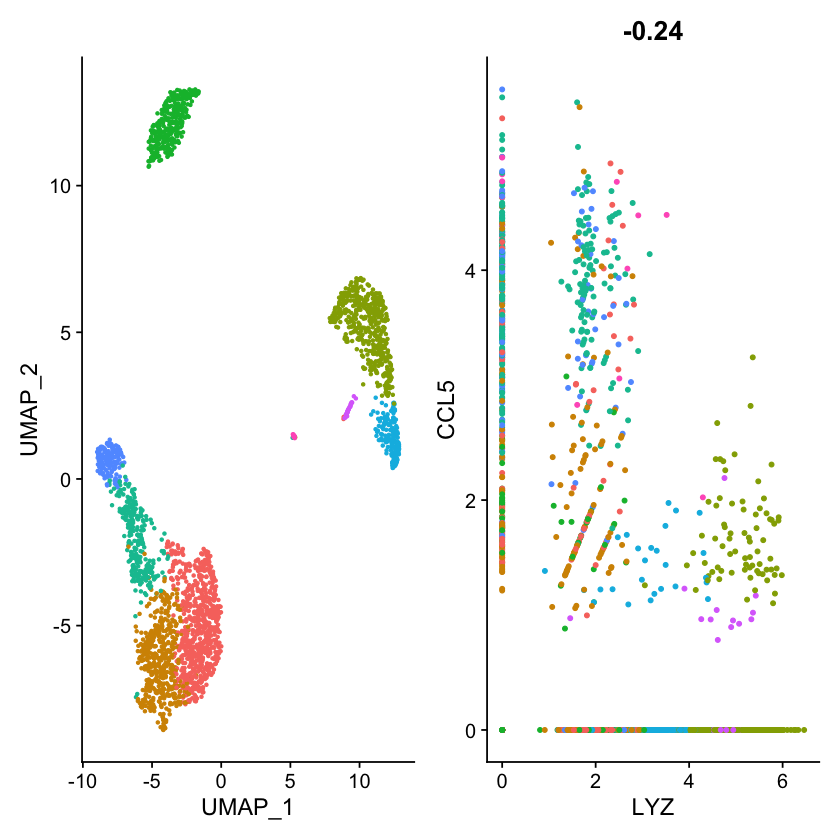

In [38]:
# Remove the legend from all plots
(plot1 + plot2) & NoLegend()